# Stacking Raster Bands

In [1]:
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from osgeo import osr
import math
import os 

In [2]:
os.chdir(r"G:\iirs\bhuvan")

In [3]:
file_names = ['image1.tif','image2.tif','image3.tif',"image4.tif"]

In [4]:
img_data= list()
for file in file_names:
    ds = gdal.Open(file)
    band = ds.GetRasterBand(1)
    data=  band.ReadAsArray()
    img_data.append(data)

In [5]:
img_data

[array([[ 787,  789,  803, ...,  669,  669,  673],
        [ 752,  755,  762, ...,  678,  677,  676],
        [ 728,  727,  729, ...,  669,  670,  679],
        ...,
        [ 851,  843,  845, ..., 2814, 2850, 2898],
        [ 858,  847,  852, ..., 2635, 2611, 2626],
        [ 862,  859,  861, ..., 2541, 2496, 2491]], dtype=uint16),
 array([[ 749,  763,  775, ...,  558,  556,  549],
        [ 706,  711,  714, ...,  562,  566,  563],
        [ 701,  699,  694, ...,  558,  556,  563],
        ...,
        [ 838,  810,  798, ..., 2369, 2339, 2373],
        [ 840,  829,  834, ..., 2259, 2232, 2210],
        [ 833,  833,  832, ..., 2214, 2175, 2144]], dtype=uint16),
 array([[ 879,  903,  930, ..., 1110, 1106, 1051],
        [ 796,  807,  823, ..., 1091, 1063, 1042],
        [ 791,  797,  802, ..., 1051, 1048, 1049],
        ...,
        [1038, 1012, 1002, ..., 2435, 2411, 2422],
        [1036, 1011, 1002, ..., 2298, 2257, 2238],
        [1014, 1008, 1003, ..., 2242, 2213, 2182]], dtype=uint

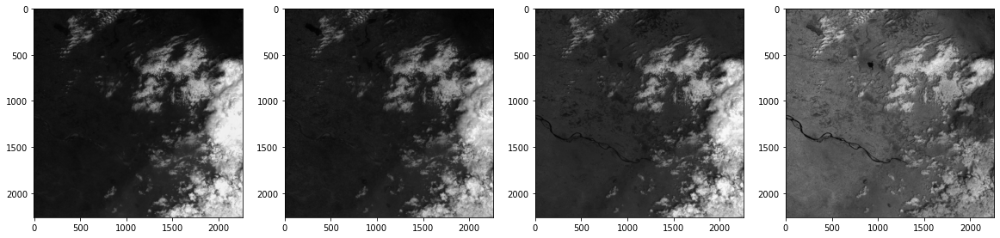

In [6]:
fig =plt.figure(figsize=(20,25))
for i in range(1,5):
    plt.subplot(1,4,i)
    plt.imshow(img_data[i-1], cmap='gray')

In [7]:
dst_file='RGB_IMG.TIF'
height, width = img_data[0].shape

In [8]:
height, width 

(2262, 2262)

In [9]:
drv=gdal.GetDriverByName('GTiff')
dst_ds=drv.Create(dst_file, width, height, 4, eType=gdal.GDT_UInt16)
dst_ds.SetProjection(ds.GetProjection())
dst_ds.SetGeoTransform(ds.GetGeoTransform())

0

In [10]:
for i in range(1, 5):
    band =dst_ds.GetRasterBand(i)
    band.WriteArray(img_data[i-1])
    #band.SetColorInterpretation(i+2)

In [11]:
dst_ds.FlushCache()

In [12]:
dst_ds= None

In [13]:
ds=gdal.Open(dst_file)

In [14]:
ds.RasterCount 

4

In [15]:
#data = ds.ReadAsArray(buf_type=gdal.GDT_Byte)
data = ds.ReadAsArray()

In [16]:
rgb_data =np.dstack(tuple(data))

In [17]:
rgb_data.shape

(2262, 2262, 4)

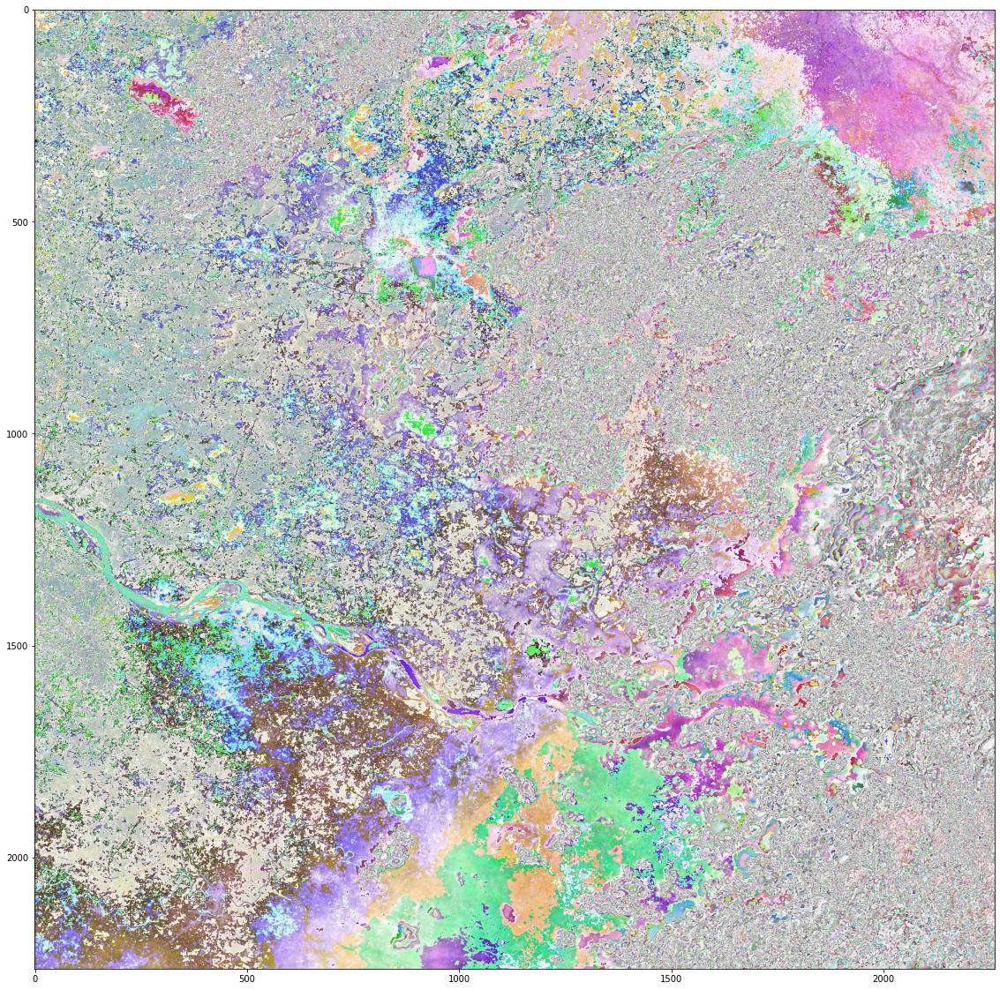

In [18]:
fig =plt.figure(figsize=(20,20))
plt.imshow((rgb_data).astype(np.uint8))

In [19]:
plt.close()

In [20]:
del data, rgb_data, ds

# Reordering Bands of a Raster

In [21]:
os.chdir(r"G:\iirs\bhuvan")
src_file = r'RGB_IMG.TIF' #File name

In [22]:
src=gdal.Open(src_file)

In [23]:
print(src.RasterCount)

4


In [24]:
ds = gdal.Translate("rgb_reorder.tif", src_file, bandList = [3,2,4,1])

In [25]:
print(ds)

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x000002DEC2E11B40> >


In [26]:
data = ds.ReadAsArray()

In [27]:
rgb_data = np.dstack(tuple(data))

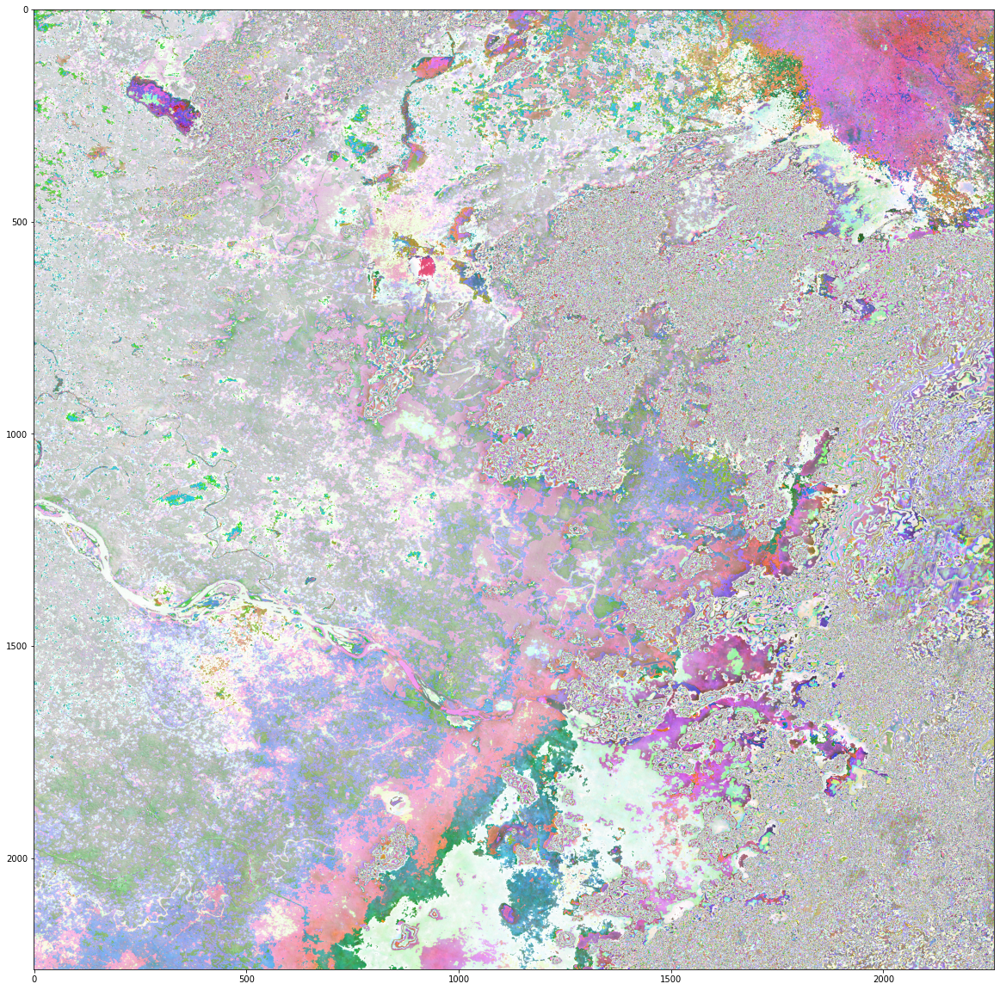

In [28]:
fig = plt.figure(figsize=(20,25))
plt.imshow(rgb_data.astype(np.uint8))

In [29]:
plt.close()

# Subsetting Raster Using real-world Coordinate

In [30]:
file_name = 'image1.tif'

In [31]:
ds = gdal.Open(file_name)

In [32]:
gt = ds.GetGeoTransform()

In [33]:
gt

(82.991, 0.0004500442086648986, 0.0, 27.009, 0.0, -0.0004500442086648986)

In [34]:
print('Upper Left Corner:', gdal.ApplyGeoTransform(gt,0,0))
print('Upper Right Corner:', gdal.ApplyGeoTransform(gt,ds.RasterXSize,0))
print('Lower Left Corner:', gdal.ApplyGeoTransform(gt,0,ds.RasterYSize))
print('Lower Right Corner:', gdal.ApplyGeoTransform(gt,ds.RasterXSize,ds.RasterYSize))

Upper Left Corner: [82.991, 27.009]
Upper Right Corner: [84.009, 27.009]
Lower Left Corner: [82.991, 25.991]
Lower Right Corner: [84.009, 25.991]


In [35]:
subset_extents = [83, 83.5, 26, 26.5] #Subset of the Raster range 

In [36]:
inv_gt = gdal.InvGeoTransform(gt)

In [37]:
offsets = gdal.ApplyGeoTransform(inv_gt, subset_extents[0], subset_extents[3])

In [38]:
xoff, yoff = map(int, offsets)

In [39]:
xoff, yoff

(19, 1131)

In [40]:
offsets_2 = gdal.ApplyGeoTransform(inv_gt, subset_extents[1], subset_extents[2])

In [41]:
xoff_2, yoff_2 = map(int, offsets_2)

In [42]:
xoff_2, yoff_2

(1131, 2242)

In [43]:
rows = yoff_2 - yoff

In [44]:
columns = xoff_2 - xoff

In [45]:
print(rows , columns)

1111 1112


In [46]:
data = ds.ReadAsArray(xoff, yoff, columns, rows)

In [47]:
data.shape

(1111, 1112)

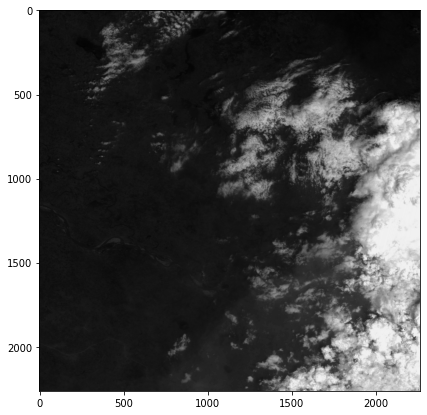

In [48]:
plt.figure(figsize=(15,15))
plt.subplot(1, 2, 1)
plt.imshow(ds.ReadAsArray(), cmap='gray')

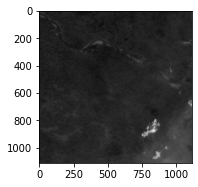

In [49]:
plt.subplot(1, 2, 2)
plt.imshow(data, cmap='gray')

In [50]:
gt_subset = list(gt)

In [51]:
gt_subset[0] = subset_extents[0]
gt_subset[3] = subset_extents[2]

In [52]:
gt_subset

[83, 0.0004500442086648986, 0.0, 26, 0.0, -0.0004500442086648986]

In [53]:
dst_ds = gdal.GetDriverByName('Gtiff').Create('subset.tif', columns, rows, 1)

In [54]:
dst_ds.SetProjection(ds.GetProjection())
dst_ds.SetGeoTransform(gt_subset)

0

In [55]:
dst_ds.GetRasterBand(1).WriteArray(data)

0

In [56]:
dst_ds.FlushCache()

In [57]:
dst_ds = None

# Resampling Raster

Change the spatial Resolution of raster dataset and set rules for aggregating or interplating values across the new pixel sizes.

Resample Techniques:

- Nearest Neighbor
- Bilinear 
- Cubic
- etc...

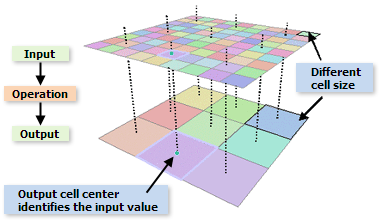

For detailed explanation, [visit here.](https://desktop.arcgis.com/en/arcmap/latest/extensions/spatial-analyst/performing-analysis/cell-size-and-resampling-in-analysis.htm)

In [58]:
file_name = 'image1.tif'

In [59]:
ds = gdal.Open(file_name)

In [60]:
band = ds.GetRasterBand(1)

In [61]:
org_data=band.ReadAsArray()

In [62]:
org_data.shape

(2262, 2262)

In [63]:
fine_data = band.ReadAsArray(buf_xsize=2262*2,buf_ysize=2262*2,resample_alg=gdal.GRA_Bilinear)
coarse_data = band.ReadAsArray(buf_xsize=100,buf_ysize=100,resample_alg=gdal.GRA_NearestNeighbour)

Text(0.5, 1.0, 'Coarse Resample')

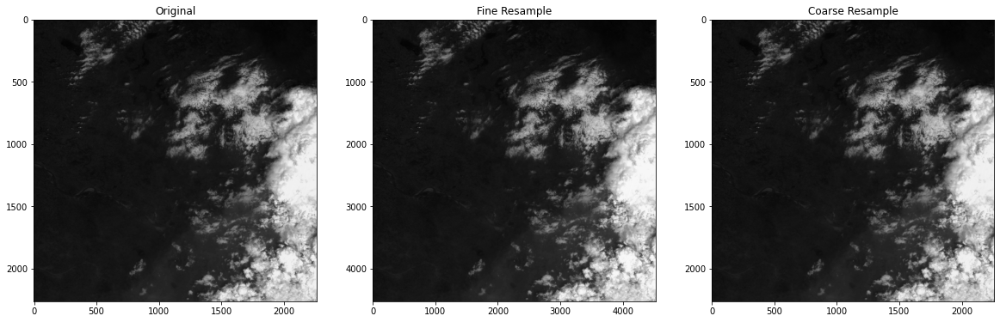

In [64]:
plt.figure(figsize=(20,20))
plt.subplot(1,3,1)
plt.imshow(org_data,cmap='gray')
plt.title('Original')

plt.subplot(1,3,2)
plt.imshow(fine_data,cmap='gray')
plt.title('Fine Resample')

plt.subplot(1,3,3)
plt.imshow(org_data,cmap='gray')
plt.title('Coarse Resample')



In [65]:
plt.close()

# Reporjecting Raster

In [66]:
file_name = 'cdnh43f.tif'

In [67]:
#Creating projected coordinate system
crs = osr.SpatialReference()
crs.SetProjCS('UTM') #UTM 44 projected coordinate system
crs.SetUTM(44)
crs.SetWellKnownGeogCS('WGS84')

0

In [68]:
crs.ExportToWkt()

'PROJCS["UTM",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",0],PARAMETER["central_meridian",81],PARAMETER["scale_factor",0.9996],PARAMETER["false_easting",500000],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'

In [69]:
old_ds = gdal.Open(file_name)

In [70]:
vrt_ds=gdal.AutoCreateWarpedVRT(old_ds, None, crs.ExportToWkt(),gdal.GRA_Bilinear)

Text(0.5, 1.0, 'Reprojection')

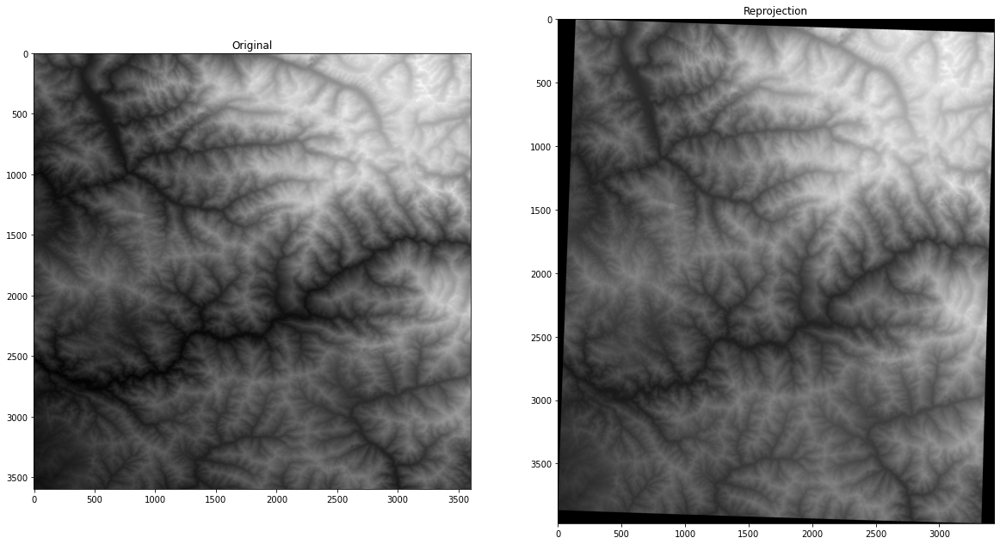

In [71]:
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.imshow(old_ds.ReadAsArray(),cmap='gray')
plt.title('Original')

plt.subplot(1,2,2)
plt.imshow(vrt_ds.ReadAsArray(),cmap='gray')
plt.title('Reprojection')


In [72]:
vrt_ds = None
old_ds = None